<a href="https://colab.research.google.com/github/IgorZhiltsoff/ippi228/blob/main/ippi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Идеи:


1.   Сопоставление с образцом (мера близости поэлементна. идеальное совпадение: 68%) ДЛЯ НОРМАЛЬНОГО. Оригинальная картинка локально портит распределение не так сильно, как глобально
3.   Зашумить + сравнить с исходным (мера близости сложна); зашумлять постепенно и сравнивать с рандомным шумом
4.   структурированные преобразования --- переворот, отражение, **ВИХРЬ**...
4.   Однородность (мера близости сложна)
5.   постоянство в мелких квадратах (непрерывность; дисперсия в малых квадратах)
6.   картинка -> звук
7.   постоянство вдоль случайного блуждания
8.   найти фильтр шума и сравнить расшумлённое изображение с исходным
10.  рассчитать плотность цвета по мелким квадратам;
10.  самоподобие


In [2]:
import numpy as np
from skimage.io import imread
import skimage
from skimage.color import rgb2gray
import matplotlib.pyplot as plt
import numpy.linalg as la
import numpy.random as rd
import scipy.stats as st

# **Примеры**

In [3]:
brains = imread('/content/drive/MyDrive/ippi/brain.png', as_gray=True)
x, y = brains.shape
halfx = x // 2
halfy = y // 2
br1 = brains[:halfx,:halfy]
br2 = brains[:halfx,halfy:]
br3 = brains[halfx:,:halfy]
br4 = brains[halfx:,halfy:]
brain = br4
brnoise = br1
brs=[br4, br3, br2, br1]

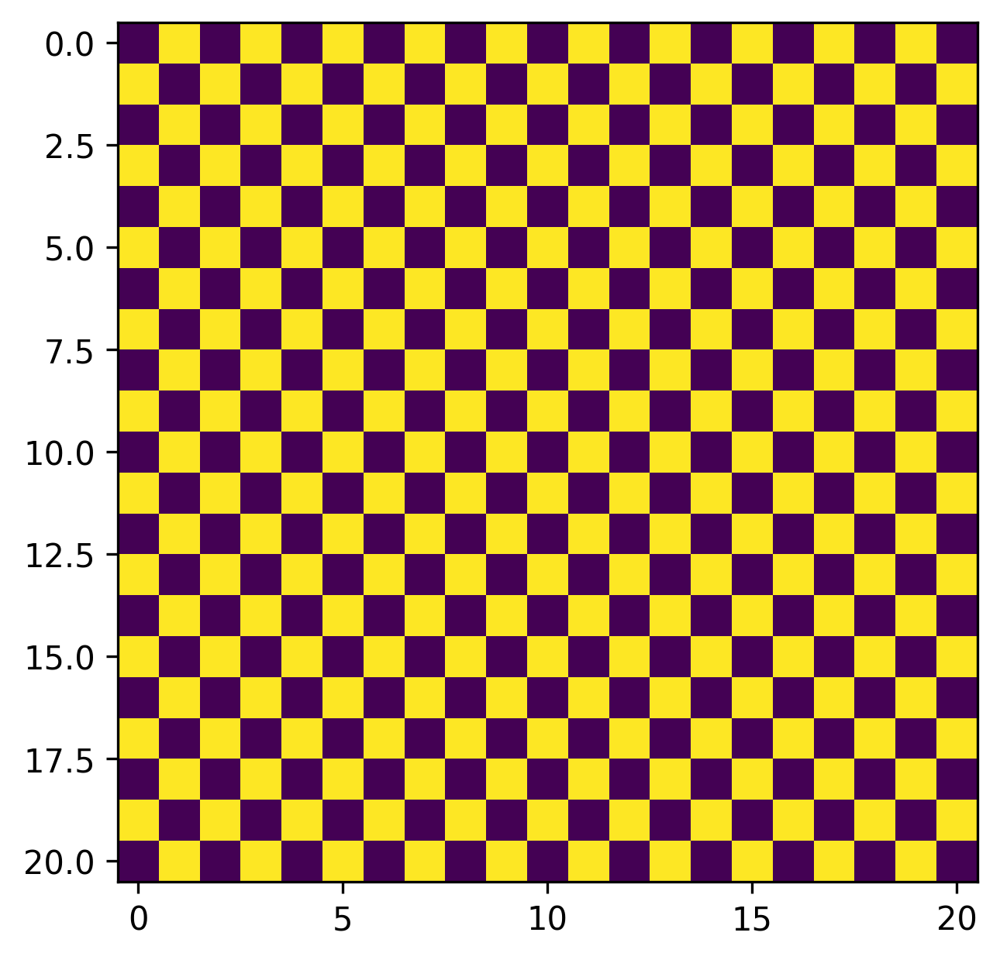

In [69]:
def mk_chess(n):
  return np.array(np.arange(n*n)%2).reshape(n,n)

microchess = mk_chess(301)
chess = mk_chess(21)

plt.figure(dpi=300)
plt.imshow(chess)

In [5]:
def add_noise(im, N=7, mu=0.5):
  x,y = im.shape
  fl = im.ravel()
  s = fl.size

  noises = rd.normal(mu, np.array([i / (N - 1) for i in range(N)]).T, size=(s, N)).T
  return (fl * noises).reshape((N,x,y))

def mk_sample(im, N=7):
  if len(im.shape) == 3:
    im = rgb2gray(im)
  ims = add_noise(im, N=N)
  fig, axx = plt.subplots(1, N, figsize=(15,15), dpi=300)
  ax = axx.ravel()
  for i in range(N):
    ax[i].imshow((ims[i]))
  plt.show()
  return ims

In [6]:
a = np.array([[1,2,5], [3,4,6]])
x,y=a.shape
ar = a.ravel()
l=ar.size
n=rd.normal(1, np.array([100,0,5,1]).T, size=(l,4)).T
(ar*n).reshape((4,x,y))

add_noise(a)

array([[[ 0.5       ,  1.        ,  2.5       ],
        [ 1.5       ,  2.        ,  3.        ]],

       [[ 0.47625568,  0.27855835,  3.62967991],
        [ 1.45722256,  2.18010039,  2.37727878]],

       [[ 0.2771876 ,  1.94965973, -0.36562058],
        [ 2.32243709,  3.10213337,  2.68914164]],

       [[ 0.23871489,  0.96111294,  3.80964035],
        [-0.50803073,  0.09509609,  4.7606334 ]],

       [[-0.18364625,  0.73947232,  1.06735454],
        [-1.38298627,  2.13919439, -0.60999396]],

       [[ 0.54613535,  0.075591  ,  1.67307683],
        [ 0.33096777,  4.40204624,  7.07216947]],

       [[ 1.08646677,  1.24215342, -2.08795189],
        [ 0.52969867,  4.88883231, 10.15017613]]])

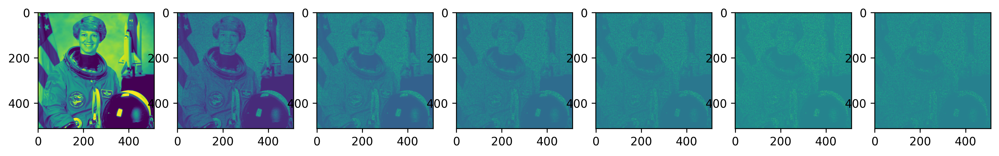

In [88]:
astro = mk_sample(skimage.data.astronaut())

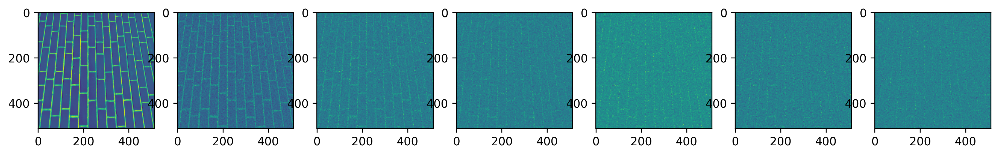

In [84]:
bricks = mk_sample(skimage.data.brick())

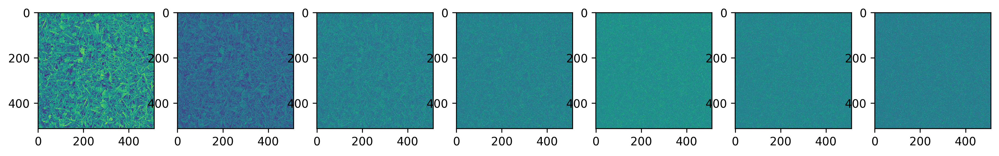

In [9]:
grasses = mk_sample(skimage.data.grass())

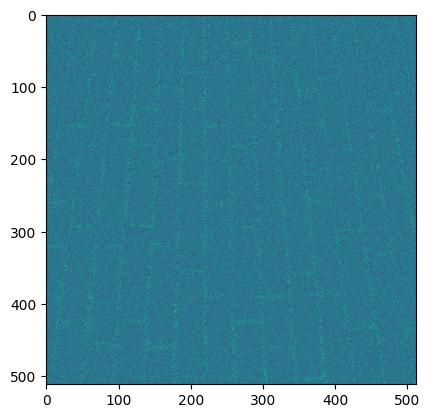

In [10]:
noise = rd.normal(0.5, 0.2, size=bricks[-2].shape)
plt.imshow(noise/2 + bricks[-2]/2)

# Близость

In [11]:
def GlobalDist(a, b):
  return np.linalg.norm(a-b)

def LGD(a, b, N=100):
  '''Locally global distance: breaks up images into N=100 small
  local pieces and compares them as globally as possible'''
  pass

vals=[]
for im in [br4, br3, br2, br1]:
  x1=150
  y1=340
  x2=x1
  y2=y2
  x3=x1+5
  y3=y1+5
  d=30
  print(
      GlobalDist(im[x1:x1+d, y1:y1+d], im[x1:x1+d, y1:y1+d]),
      GlobalDist(im[x2:x2+d, y2:y2+d], im[x3:x3+d, y3:y3+d])
  )

#fig, ax = plt.subplots(4,2, figsize=(15, 10),dpi=300)
#for i in range(4):
#  for j in range(2):
#    ax[i][j].hist(vals[i][j])

NameError: ignored

In [ ]:
def GlobalDist(a,)

In [ ]:
plt.imshow(br3[x1:x1+d, y1:y1+d])

# Шум

In [ ]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10),dpi=300)
for i in range(2):
  for j in range(2):
    noisiness = j / 4 + i / 2
    axes[i][j].imshow(brain * (1 - noisiness) + brnoise * noisiness)

# Преобразования

In [12]:
def whirlwind(a, x, y, N):
  pass


def crop(a, D=10):
  a = np.copy(a)
  n,m = a.shape
  nD = n // D
  mD = m // D
  return a[nD:(D-1)*nD, mD:(D-1)*mD]

def croppedx4(a, D=10):
  a = crop(a, D)
  h=np.hstack((a,a))
  return np.vstack((h,h))

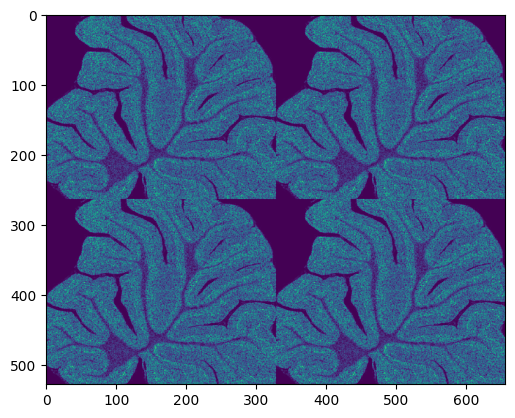

In [13]:
plt.imshow(croppedx4(br3))

In [14]:
len([x for line in np.abs(brain - brnoise) for x in line  if x < 0.2])/(len(brain.ravel()))

0.43543966912425824

#

# Сопоставление с образцом

**NAIVE**

In [17]:
a=np.array([[1,2],[3,1]],)
np.unique(a,return_counts=True)
#a[a==u[0]]=228
#a

(array([1, 2, 3]), array([2, 1, 1]))

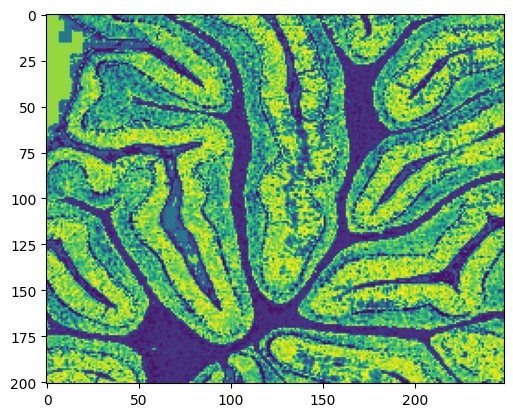

In [18]:
def spread_out_brightness(im, delta=0.1):
  im = crop(im,D=5)
  gamma, freq = np.unique(im.ravel(), return_counts=True)
  freq = freq / freq.sum()
  N = gamma.size

  for i in range(N):
    im[im == gamma[i]] = freq[i]

  return im



#fig, ax = plt.subplots(2, 4, figsize=(10,5), dpi=300)

#for i in range(2):
#  for j in range(4):
#    fun = (lambda x: x) if i == 0 else spread_out_brightness
#    #ax[i][j].imshow(fun(brs[j]))

#plt.imshow((spread_out_brightness(br3)))
plt.imshow((
    spread_out_brightness(br4,5)))

In [ ]:
def within_sqrt2_sigmas(diff, sigma):
  sigma *= np.sqrt(2)
  diff = diff.ravel()
  N = diff.size
  t_sigma_rule = lambda t: len([x for x in diff if np.abs(x) < t * sigma]) / N
  return np.array([t_sigma_rule(1/2), t_sigma_rule(1), t_sigma_rule(3/2)])

def mean_sigma_ratio(a, N=10):
  a = crop(a)
  dt = a.ravel()
  mu = a.mean()
  sigma = a.std()

  means = 0
  for i in range(N):
    noise = rd.normal(mu, sigma, size=a.shape)
    means += within_sqrt2_sigmas(a - noise, sigma)
  return means / N

def distance_from_normal_naive(a):
  reference_sigmas = np.array([0.38, 0.68, 0.86])
  sigmas = mean_sigma_ratio(a)
  return np.abs(reference_sigmas - sigmas).min()


for x in [br1, br2, np.modf(br3 / br3.mean())[0], br4]:
  print(distance_from_normal_naive(x))

**SHAPIRO-WILK**

In [15]:
def distance_from_normal_SW(a):
  a = crop(a)
  return st.shapiro(a).statistic


**SHAPIRO-WILK LOCAL**

In [76]:
def localize(a, glob, N):
  x, y = a.shape
  N = min(N, x // 10, y // 10)
  a = crop(a)
  x, y = a.shape
  dists = []
  for i in range(N):
    for j in range(N):
      dists.append(glob(a[x * i // N:x * (i+1) // N, y * i // N:y * (i+1) // N]))
  return np.array(dists)

In [77]:
def distance_from_normal_SWLoc(a, N=20):
  return localize(a, distance_from_normal_SW, N).mean()

In [37]:
a=np.array([[1,2,3,4],[5,6,7,8],[9,10,11,12],[13,14,15,16]])
a.reshape((2,2,4),)

array([[[ 1,  2,  3,  4],
        [ 5,  6,  7,  8]],

       [[ 9, 10, 11, 12],
        [13, 14, 15, 16]]])

**SIGMA**

In [80]:
def distance_from_random_sigma(a):
  return a.std()

def distance_from_random_sigmaLoc(a, N=20):
  return localize(a, distance_from_random_sigma, N).mean()


# Экспериментики

In [ ]:
def apply_to_ims(fun, *ims):
  n = len(ims)
  fig, axes = plt.subplots(1, n, figsize=(15, 10),dpi=300)
  ax = axes.ravel()
  for i in range(n):
    ax[i].imshow(fun(ims[i]))

**matmul**

In [ ]:
def squarify(M,val=1):
    (a,b)=M.shape
    if a>b:
        padding=((0,0),(0,a-b))
    else:
        padding=((0,b-a),(0,0))
    return np.pad(M,padding,mode='constant',constant_values=val)

def mmmod1(a,b):
  return np.modf(np.matmul(a, b))[0]

def minus(im):
  imq = squarify(im)
  return np.modf(imq - mmmod1(imq, imq))[0]

def imimT(im):
  return mmmod1(im, im.T)

In [ ]:
apply_to_ims(minus, brain, brnoise)

In [ ]:
apply_to_ims(imimT, brain, brnoise)

In [ ]:
brnq = squarify(brnoise)
plt.imshow(brnq)

In [ ]:
n=100
plt.figure(dpi=300)
plt.imshow(np.array(np.arange(121)%2).reshape(11,11))

# **ТЕСТЫ**

In [56]:
def test(f, ds):
  for x in ds:
    print(f(x))

def test_astro(f):
  test(f, astro)

def test_bricks(f):
  test(f, bricks)

def test_chess(f):
  test(f, [chess])

def test_grasses(f):
  test(f, grasses)

**Образец**

naive, SW

In [41]:
test_astro(distance_from_normal_SW)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


0.9440240263938904
0.9556092023849487
0.9305426478385925
0.9338630437850952
0.9401297569274902
0.9448943734169006
0.9461281299591064


In [43]:
test_bricks(distance_from_normal_SW)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1882: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


0.696098804473877
0.9568005204200745
0.9821968078613281
0.989343523979187
0.9918444156646729
0.9928244352340698
0.9937013387680054


In [45]:
test_grasses(distance_from_normal_SW)

0.9894738793373108
0.9825849533081055
0.9822862148284912
0.9865503311157227
0.9887828826904297
0.9898722767829895
0.9906717538833618


In [51]:
test_chess(distance_from_normal_SW)

0.6365644335746765


SWLoc

In [48]:
test_astro(distance_from_normal_SWLoc)

/usr/local/lib/python3.10/dist-packages/scipy/stats/_morestats.py:1879: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "


0.8418578296899796
0.8676716178655625
0.8606980085372925
0.869782131910324
0.8691773235797882
0.871749284863472
0.8771995395421982


In [49]:
test_bricks(distance_from_normal_SWLoc)

0.754413264989853
0.9727846503257751
0.9822544664144516
0.987559574842453
0.9894518166780472
0.9874775737524033
0.9892662227153778


In [50]:
test_grasses(distance_from_normal_SWLoc)

0.9628371328115464
0.9673287361860275
0.9783652037382126
0.9797815710306168
0.9782493442296982
0.980783611536026
0.9831233590841293


In [64]:
test_chess(distance_from_normal_SWLoc)

0.6365644335746765


**SIGMALoc**
VERY GOOD!!!!
Следующий шаг: постепенно зашумлять изображение, чтобы понять в каких диапазонах
меняется метрика, и отнормировать на него.

In [89]:
test_astro(distance_from_random_sigmaLoc)

0.05142122328785951
0.08656106870977935
0.13240026600043742
0.18267940944498023
0.2389610059913802
0.2963010474424537
0.3522023212267726


In [90]:
test_bricks(distance_from_random_sigmaLoc)

12.404205302658998
22.8374290872194
40.62680109153273
58.801089304772994
77.43887391265466
97.12395037229257
115.66774924039898


In [91]:
test_grasses(distance_from_random_sigmaLoc)

18.537652384980728
28.218688853589985
45.49851181393819
64.9840832463527
84.78847081267217
105.73909603321786
124.76586971776793


In [92]:
test_chess(distance_from_random_sigmaLoc)

0.5
